<a href="https://colab.research.google.com/github/VicenteMercado/LabsIA/blob/main/Lab4_Grupo15.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Integrantes:
- Benjamín Díaz
- Benjamín Fernández
- Vicente Mercado
- Thomas Molina

# Objetivos del Laboratorio

Se buscará generar modelos de clasificación y regresión basados en el uso de redes neuronales que permitan clasificar distintas variables según los atributos entregados en los datasets.

Para esto, utilizaremos las dos tablas (Datasets) entregados junto con el problema, uno sobre vinos tintos `wineRed` y otro de vinos blancos `wineWhite`.

En este caso, el objetivo del modelo de clasificación será clasificar los vinos tintos y los vinos blancos según su calidad, y el del modelo de regresión será predecir la calidad de ambos tipos de vino, los cuales pueden ser de baja calidad (1 a 4 puntos), calidad media (5 puntos) o alta calidad (6 a 9 puntos).

In [ ]:
#@title Importar las librerías necesarias.
import numpy as np
import sklearn as sk
import pandas as pd
import matplotlib as matplt
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score, KFold
import tensorflow as tf
from keras import models
from keras import layers
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

#Preprocesamiento de Datos:

Durante esta sección se realizará un preprocesamiento a los datos disponibles en función de poder trabajar con redes neuronales.

##Conocer los Datos.

In [ ]:
#@title Leer los CSV.
wineRed = pd.read_csv("winequality-red.csv", sep=";")
wineWhite = pd.read_csv("winequality-white.csv", sep=";")

In [ ]:
#@title Mostrar la cabecera de la tabla de Vinos Tintos
wineRed.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
#@title Mostrar la cabecera de la tabla de Vinos Blancos
wineWhite.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [ ]:
#@title Ver el tipo de dato para cada atributo
#@markdown Se busca analizar los tipos de datos para realizar una corrección de ser necesario y valores nulos para filtrarlos.
wineRed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [ ]:
wineWhite.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


Se entiende que no hay datos nulos, y que todos los datos son númericos, por lo que es posible continuar utilizando los datasets originales.

#Asignación de categorías (verbal y númerica)

Para una visualización más comprensible de la distribución de los vinos según su calidad, se creará una nueva columna `verb_quality` que contendrá, en palabras, la categoría correspondiente a un vino dada su puntuación en `quality`, donde los valores del 1 al 4 corresponden a `lowQualiity`, el valor 5 se asigna para `Average` y los valores del 6 en adelante perteneceran a `highQuality`.

A su vez, la columna `quality_catnum` contendrá la categoría de cada vino bajo representación numérica, siendo:

`1 = lowQuality` ; `2 = Average` ; `3 = highQuality`.

In [ ]:
#@title Clasificación por categoría verbal.
wineRed["verb_quality"] = pd.cut(x = wineRed["quality"], bins = [2,4,5,np.inf],labels = ["lowQuality", "Average","HighQuality"])
wineWhite["verb_quality"] = pd.cut(x = wineWhite["quality"], bins = [2,4,5,np.inf],labels = ["lowQuality", "Average","HighQuality"])

In [ ]:
#@title Clasificación por categoría numérica.
#1: lowQuality, 2: Average, 3: highQuality
quality_mapping_numeric = {3: 1, 4: 1, 5: 2, 6: 3, 7: 3, 8: 3, 9: 3}

wineRed['quality_catnum'] = wineRed['quality'].map(quality_mapping_numeric)
wineRed['quality_catnum'] = pd.to_numeric(wineRed['quality_catnum'])

wineWhite['quality_catnum'] = wineWhite['quality'].map(quality_mapping_numeric)
wineWhite['quality_catnum'] = pd.to_numeric(wineWhite['quality_catnum'])

In [ ]:
#@title Categorización de los vinos tintos.
wineRed

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,verb_quality,quality_catnum
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Average,2
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Average,2
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Average,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,HighQuality,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Average,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,Average,2
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,HighQuality,3
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,HighQuality,3
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,Average,2


In [ ]:
#@title Categorización de los vinos blancos.
wineWhite

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,verb_quality,quality_catnum
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,HighQuality,3
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,HighQuality,3
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,HighQuality,3
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,HighQuality,3
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,HighQuality,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,HighQuality,3
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,Average,2
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,HighQuality,3
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,HighQuality,3


# Análisis de distribución para Clasificación:

Para justificar el uso de redes neuronales se presentará a continuación un análisis realizado a la distribución de datos, este análisis fue orientado para construir un modelo de clasificación. En primer lugar se analizará, la distribución de los vinos tintos y blancos acorde a su cantidad. Para un segundo análisis, se realizará un gráfico de pairplot y ver la distribución de los datos de calidad (`verb_quality`), en función de cada atributo.

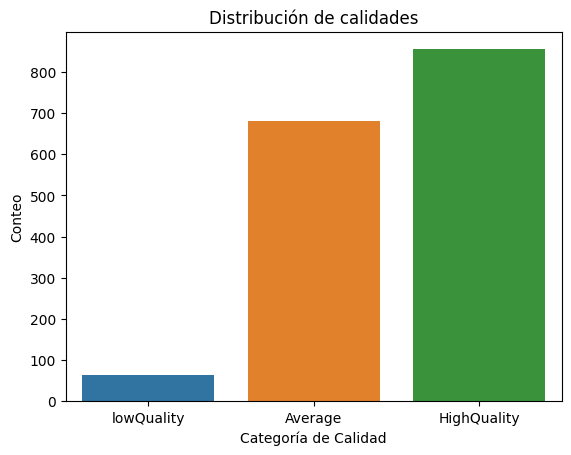

In [ ]:
#@title Distribución de las calidades de los vinos tintos
sns.countplot(x='verb_quality', data=wineRed)
plt.title('Distribución de calidades')
plt.xlabel('Categoría de Calidad')
plt.ylabel('Conteo')
plt.show()

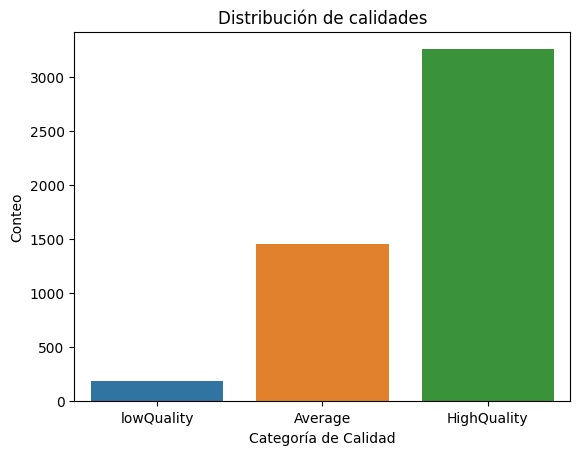

In [ ]:
#@title Distribución de las calidades de los vinos blancos
sns.countplot(x='verb_quality', data=wineWhite)
plt.title('Distribución de calidades')
plt.xlabel('Categoría de Calidad')
plt.ylabel('Conteo')
plt.show()

## Conclusión
En resumen, para ambos gráficos se puede ver una baja cantidad de valores para `lowQuality`.

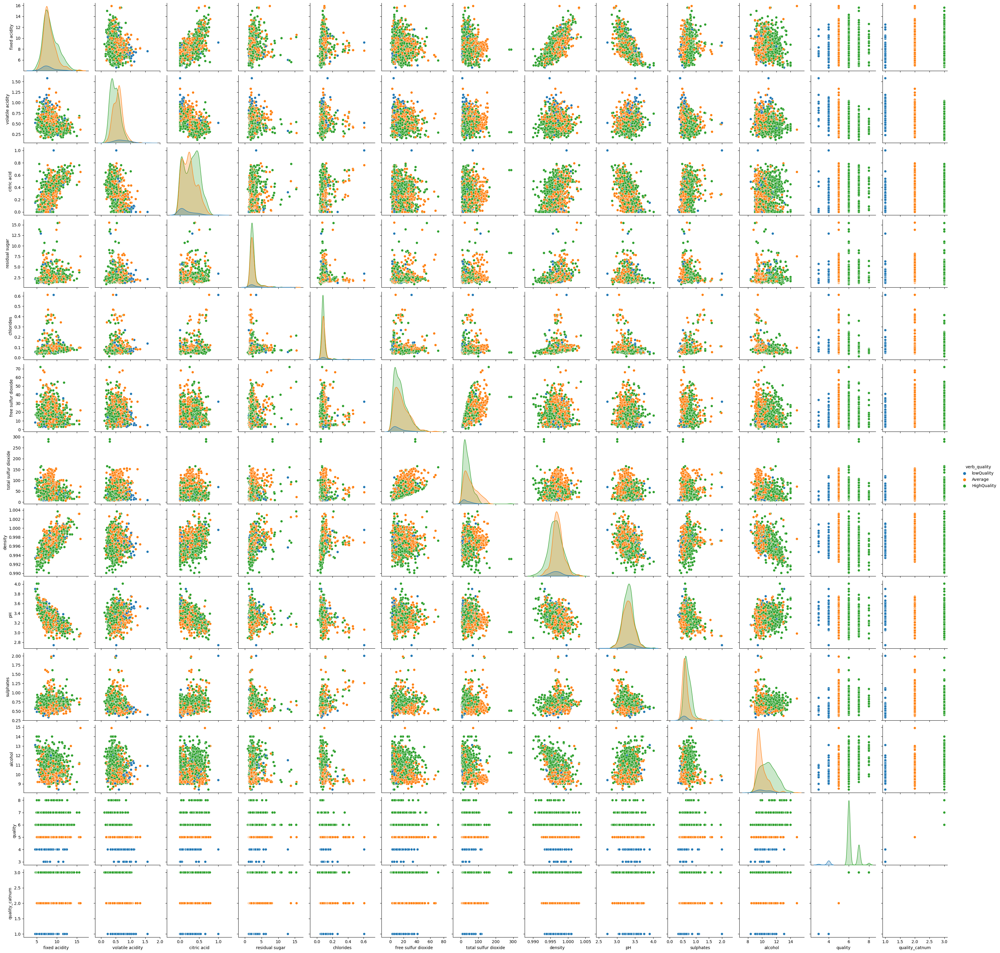

In [ ]:
#@title Gráfica de Vinos Tintos
sns.pairplot(wineRed, hue='verb_quality')

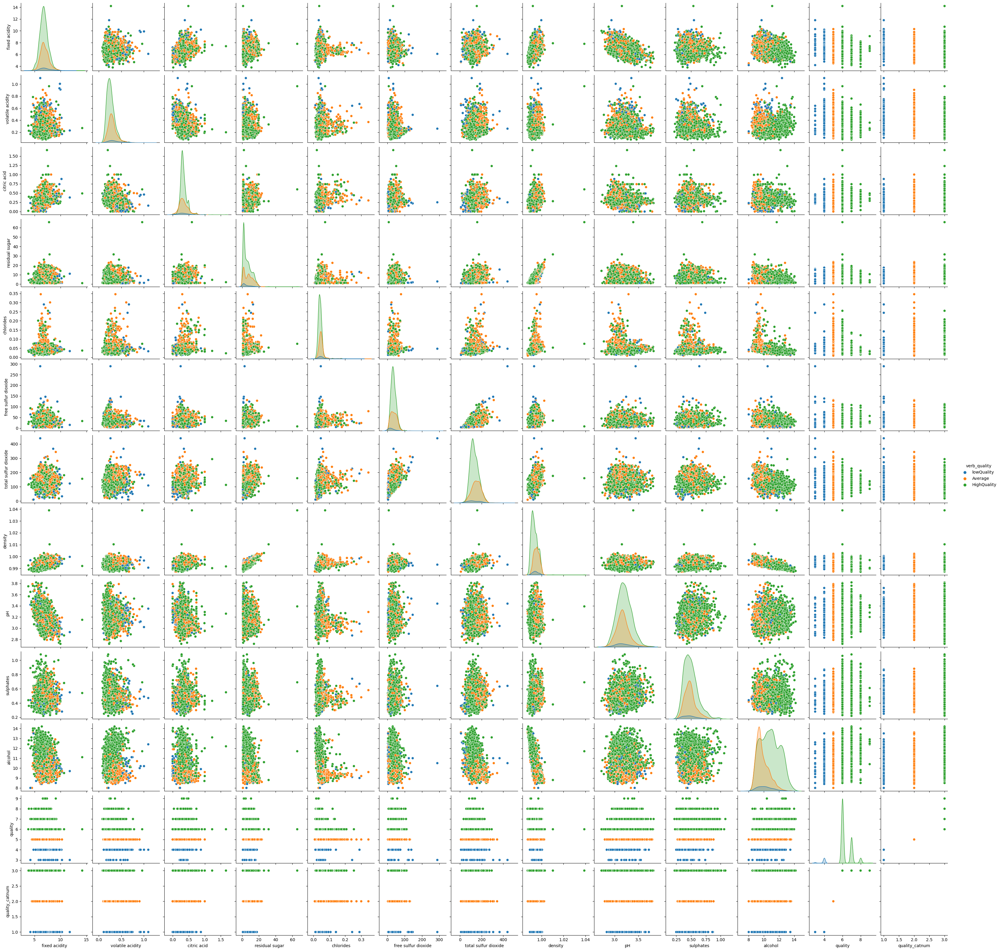

In [ ]:
#@title Gráfica de Vinos Blancos
sns.pairplot(wineWhite, hue='verb_quality')

###Conclusión

Los gráficos generados no muestran con suficiente exactitud una segregación de los datos utilizando 2 atributos clasificadores. Por ende, un modelo de clasificación utilizando sólo 2 características no es de mucho fiar.

# Análisis de distribución para Predicción:

Para justificar el uso de redes neuronales en un modelo de regresión/predicción, también es posible analizar la distribución de datos. Para aquello, se revisará, con la ayuda de gráficos de pairplot, la distribución de los puntos generados por la relación entre cada característica con la etiqueta `quality`.

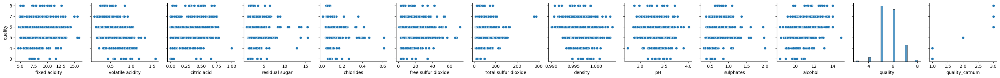

In [ ]:
#@title Gráfico de Vinos Tintos, pero sólo usando la fila de comparación con `quality`
sns.pairplot(wineRed,y_vars=["quality"])

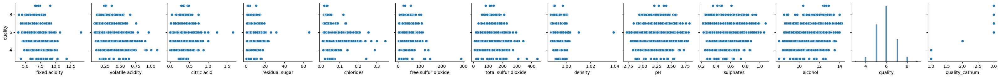

In [ ]:
#@title Gráfico de Vinos Blancos, pero sólo usando la fila de comparación con `quality`
sns.pairplot(wineWhite,y_vars=["quality"])

###Conclusión

Es posible observar que ningún gráfico denota una distribución lo suficientemente lineal para poder generar un modelo de regresión lineal adecuado.

## Observar la correlación de cada atributo con la etiqueta `quality`

Para visualizar el problema de la poca relación entre los datos, se aplicará al set de datos una función que permita conocer la correlación que sostienen los datos entre sí (y principalmente con la variable `quality`).

<ipython-input-17-6a45960636ca>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation= wineRed.corr()


<Axes: >

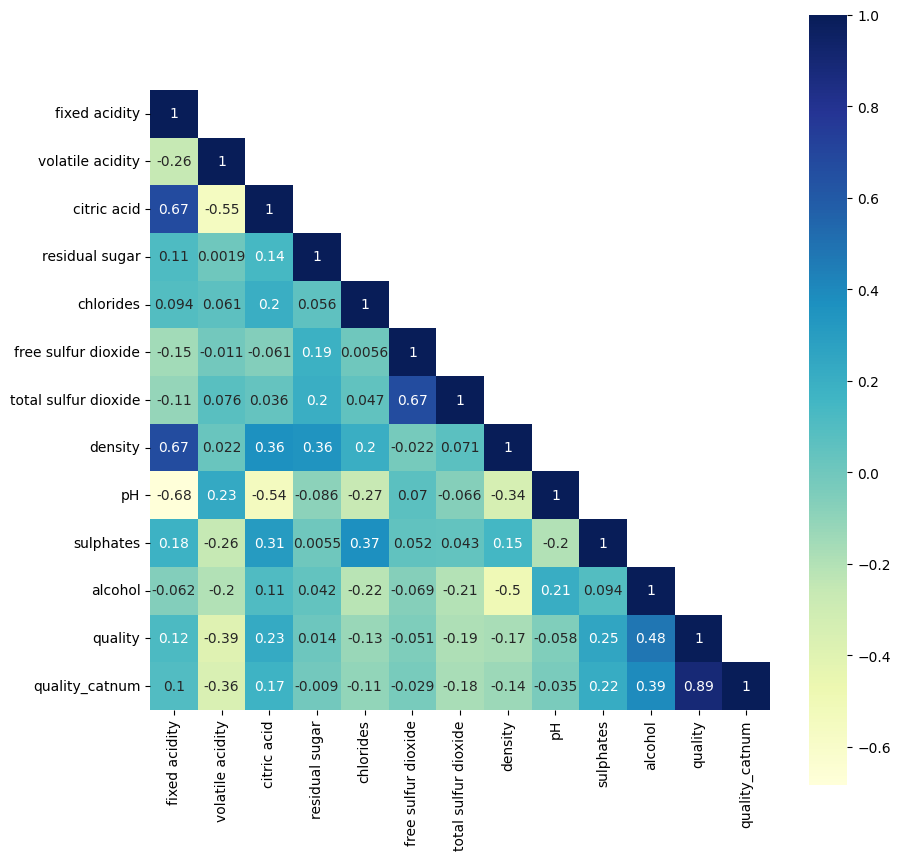

In [ ]:
#@title Mostrar gráfico de correlación de los Vinos Tintos
correlation= wineRed.corr()
mask = np.array(correlation)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(10,10)
sns.heatmap(data=correlation,mask=mask,square=True,annot=True,cbar=True,cmap="YlGnBu")

### Conclusión

En base a lo entregado por la gráfica de correlación se puede apreciar que los valores más cercanos a 1 son los atributos `alcohol = 0.48`, `sulphates = 0.25` y `citric acid = 0.23`. Lamentablemente, los atributos individualmente no tienen una correlación lo suficientemente fuerte como para ser considerados en un modelo de regresión.

<ipython-input-18-17151e677a52>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = wineWhite.corr()


<Axes: >

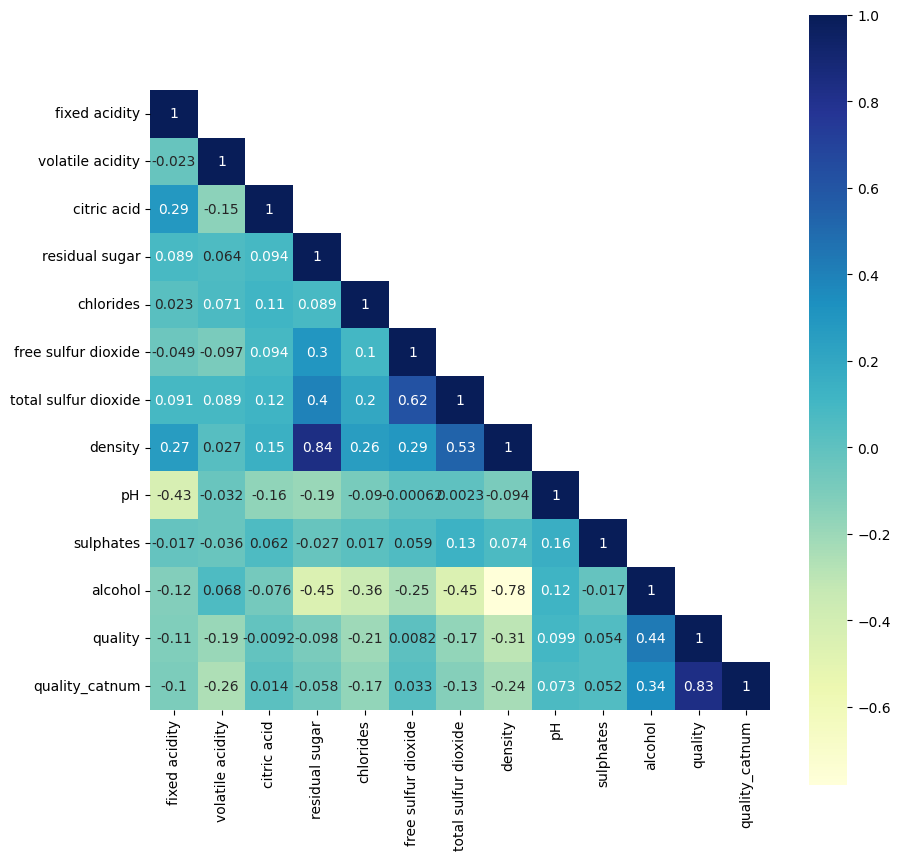

In [ ]:
#@title Mostrar gráfico de correlación de los Vinos Blancos
correlation = wineWhite.corr()
mask = np.array(correlation)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(10,10)
sns.heatmap(data=correlation,mask=mask,square=True,annot=True,cbar=True,cmap="YlGnBu")

### Conclusión

De la gráfica se puede extraer que para los vinos blancos los atributos que tienen mayor correlación entre sus datos son `alcohol = 0.44`, `pH = 0.099` y `sulphates = 0.054`. Sin embargo, los atributos muestran valores muy alejados a 1, por ende su correlación es débil (muy débil en el caso de los últimos dos atributos). Si se genera un modelo lineal con aquellos atributos, probablemente no sería muy bueno.

#Utilización de Redes Neuronales

La principal ventaja de usar redes neuronales para problemas de predicción y clasificación en aprendizaje supervisado, es que una red neuronal se puede someter a problemas de alto computo, y que sean muy complejos. Particularmente, para este caso, se vió en el preprocesamiento y análisis de datos, que los modelos lineales no son de mucha ayuda, puesto a que los atributos individualmente no tienen mucha relación con la variable `quality`. Es por ello, que un modelo de red neuronal, podría otorgar mejores soluciones a los problemas de predicción y clasificación.

# Funciones para crear los modelos de redes neuronales

En la siguiente sección, se mostrará y describirán los bloques de código que permitirán crear las redes neuronales que se utilizarán para el taller. Se utilizará la librería TensorFlow para crear el modelo, y la librería sklearn para aplicar el K-Fold Cross Validation.

##Construcción del modelo de predicción

Para construir el modelo se utiliza la librería TensorFlow que permite de forma más sencilla añadir capas de nodos a la red neuronal.

**Pasos:**
- El primer paso es crear una variable de que pueda almacenar y representar a la red neuronal.
- Para comenzar con la red, se agrega una capa inicial que recibirá los imputs. En este caso, se construirá un modelo que recibirá todos los atributos/características como imput, por lo que el número de estas será la dimensión. A fin de abordar la mayor cantidad de valores posibles para los imputs, la primera capa tendrá un número alto de neuronas, sin embargo, es necesario no excederse, pues puede provocar overfitting en el modelo.
- Después se agregan las capas intermedias. La cantidad de neuronas de cada capa irá disminuyendo periódicamente conforme se acerque la red a la capa de salida, puesto que para un modelo de predicción, se espera que los posibles resultados (outputs) que se generen en las capas, convergan en un solo valor. La cantidad de capas está definida para que la cantidad de neuronas por capa disminuya poco a poco.
- El siguiente paso es agregar una capa de salida, la cual debe tener una única neurona en la cual convergan todos los valores outputs de la capa anterior.
- Para finalizar, se debe compilar el modelo. En este paso es necesario definir un algoritmo optimizador, en este caso será el `stochastic gradient descent` que destaca como un algoritmo conocido para la creación de redes neuronales y problemas de regresión. Además se debe especificar la función de costo, la cual será el `MSE`, que destaca por denotar los errores más graves sobre los más bajos. Por último se define una métrica para calcular error, `MAE` es seleccionada en esta ocasión, por ser una métrica simple.

**Sobre las Funciones de Activación**: La función de activación queda en el código como "a elección del usuario", sin embargo, para efectos de demostración en el taller se utilizarán las siguientes funciones:

- Función Sigmoide o Función Logística: Esta función de activación es bastante utilizada en estadística para generar predicciones y tiene la ventaja de tener límites en su gráfico, lo que evita que se sobrepase en ciertos valores, y también evita que entregue valores negativos, que no corresponderían a este modelo de predicción.

- Función Tangente Hiperbólica: Esta función tiene una estructura similar a la función sigmoide, o sea que permite limitar los valores. No obstante, esta función también permite valores negativos en su salida, aunque sólo si existen inputs negativos, lo cual no sería este caso. Esta función se utilizará para comparar resultados con lo obtenido en la función logística.

A raíz de lo anterior, se exhíbe el siguiente bloque de código que muestra la construcción del modelo de predicción.


In [ ]:
#@title Construcción del modelo de predicción

def build_prediction_model(activFunc):
    #Crear un soporte para el modelo.
    model = tf.keras.models.Sequential()

    #Agregar capa inicial / de entrada
    model.add(layers.Dense(64, activation=activFunc, input_dim=11))

    #Agregar capas ocultas / intermedias
    model.add(layers.Dense(32, activation=activFunc))
    model.add(layers.Dense(16,activation=activFunc))
    model.add(layers.Dense(8,activation=activFunc))

    #Agregar capa de salida
    model.add(layers.Dense(1,activation=activFunc))

    #Compilar el modelo
    model.compile(optimizer='SGD',          #Usa el SGD como optimizador
              loss='mse',                   #Usa el MSE como función de costo
              metrics=['mae', 'accuracy'])  #Entrega el MAE y el Accuracy.

    #Retornar el modelo
    return model

##Función de Entrenamiento y Testeo de datos

Anexo a la explicación anterior, se encuentra a continuación un bloque de código que se encarga de entrenar la red neuronal, y posteriormente, predecir los datos de testing seleccionados. Se incluye un paso de normalización de los datos que se utilizarán para predecir, y otro para preprocesar los datos a predecir. Para la implementación del K-Fold, resulta necesario hacer un ciclo iterativo para obtener los datos de training y testing de cada fold, además de realizar el proceso de predicción para cada uno de los fold. Como paso extra para la implementación de K-Fold, se deben promediar los resultados de métricas obtenidas según el valor de `k` seleccionado, en función de obtener un valor de métrica promedio para todo el modelo.

In [ ]:
#@title Función para construir una red neuronal con K-Fold Cross Validation

def NeuronalNetworkPrediction(xColumns, yColumn, data, activFunc):
  #Transformar las series a arreglos
  xValues = data[xColumns].values
  yValues = data[yColumn]

  #Normalización de datos (en X)
  sc = StandardScaler()
  xValues = sc.fit_transform(xValues)

  #Preprocesamiento de datos (en Y)
  encoder = LabelEncoder()
  encoder.fit(yValues)
  yValues = encoder.transform(yValues)
  yValues = to_categorical(yValues)

  #Generar los folds
  folds = KFold(n_splits=5,shuffle=True,random_state=42)

  #Crear listas para almacenar los valores de las métricas utilizadas en cada fold
  lossFunctionValues = []
  metricsValues = []
  accuracyValues = []

  #En un ciclo iterativo, crear modelos de redes neuronales individuales para cada split
  for train, test in folds.split(xValues):
    #Obtener los datos de training y testing
    predTrainX, predTrainY = xValues[train], yValues[train]
    predTestX, predTestY = xValues[test], yValues[test]

    #Construir el modelo de NN
    NN_Model = build_prediction_model(activFunc)
    NN_Model.fit(predTrainX, predTrainY, epochs=50, verbose=0) #epochs = 50 para optimizar el tiempo

    #Evaluar el modelo según los datos de testing y añadir los resultados a las listas
    mseScore, maeScore, accuracyScore = NN_Model.evaluate(predTestX, predTestY, verbose = 0)
    lossFunctionValues.append(mseScore)
    metricsValues.append(maeScore)
    accuracyValues.append(accuracyScore)

  #Obtener el promedio de las listas
  avgLossFunctionValues = np.mean(lossFunctionValues)
  avgMetricsValues = np.mean(metricsValues)
  avgAccuracyValues = np.mean(accuracyValues)

  #Retornar los valores promedio
  return avgLossFunctionValues, avgMetricsValues, avgAccuracyValues

##Obtener las métricas de las predicciones

A continuación se muestran los valores que entregaron la función de costo y la métrica de error, después de utilizar los valores de testing para el feedforward de la red neuronal.

In [ ]:
#@title Atributos Vinos Tintos

#Función Sigmoide
mseResults, maeResults, accuracyResults = NeuronalNetworkPrediction(np.array(wineRed.columns)[0:11],'quality', wineRed, 'sigmoid')
print('Valores Obtenidos con la Función Sigmoide:')
print('Función de pérdida (MSE):', mseResults)
print('Métrica de error (MAE):', maeResults)
print('Accuracy Promedio:', accuracyResults)

print()

#Función Tangente Hiperbólica
mseResults, maeResults, accuracyResults = NeuronalNetworkPrediction(np.array(wineRed.columns)[0:11],'quality', wineRed, 'tanh')
print('Valores Obtenidos con la Función Tangente Hiperbólica:')
print('Función de pérdida (MSE):', mseResults)
print('Métrica de error (MAE):', maeResults)
print('Accuracy Promedio:', accuracyResults)

Valores Obtenidos con la Función Sigmoide:
Función de pérdida (MSE): 0.13890874683856963
Métrica de error (MAE): 0.28032981157302855
Accuracy Promedio: 0.8333333730697632

Valores Obtenidos con la Función Tangente Hiperbólica:
Función de pérdida (MSE): 0.1404092937707901
Métrica de error (MAE): 0.278709477186203
Accuracy Promedio: 0.8333333730697632


In [ ]:
#@title Atributo Vinos Blancos

#Función Sigmoide
mseResults, maeResults, accuracyResults = NeuronalNetworkPrediction(np.array(wineWhite.columns)[0:11],'quality', wineWhite, 'sigmoid')
print('Valores Obtenidos con la Función Sigmoide:')
print('Función de pérdida (MSE):', mseResults)
print('Métrica de error (MAE):', maeResults)
print('Accuracy Promedio:', accuracyResults)

print()

#Función Tangente Hiperbólica
mseResults, maeResults, accuracyResults = NeuronalNetworkPrediction(np.array(wineWhite.columns)[0:11],'quality', wineWhite, 'tanh')
print('Valores Obtenidos con la Función Tangente Hiperbólica:')
print('Función de pérdida (MSE):', mseResults)
print('Métrica de error (MAE):', maeResults)
print('Accuracy Promedio:', accuracyResults)

Valores Obtenidos con la Función Sigmoide:
Función de pérdida (MSE): 0.12244926542043685
Métrica de error (MAE): 0.24494455754756927
Accuracy Promedio: 0.857142961025238

Valores Obtenidos con la Función Tangente Hiperbólica:
Función de pérdida (MSE): 0.12289176732301713
Métrica de error (MAE): 0.24515492618083953
Accuracy Promedio: 0.857142961025238


##Conclusión:

Ambas funciones de activación son buenas para la predicción en ambos datasets, pues los valores de `accuracy` son mayores a `0.80`, lo que representa un acierto en más del 80%.

En cuanto a una comparación entre los dos modelos, la tangente hiperbólica entrega métricas levemente mejores que la función sigmoide, sin embargo, el `accuracy` de ambas funciones es igual en ambos set de datos.

##Construcción del modelo de Clasificación

Para crear un modelo de red neuronal que funcione para clasificación, es posible basarse en la función vista anteriormente para regresión, aunque por supuesto, con ciertos cambios. Estos serían los siguientes:

- La capa de salida tendrá 3 neuronas en lugar de 1, ya que cada una de estas representará a una clase en particular.
- Se utiliza como función de pérdida `categorical_crossentropy`, una función diseñada para clasificadores que utilizan más de 2 clases en el atributo etiqueta.
- Se utiliza como métrica el `accuracy` únicamente, para saber que tan exacto resulta el modelo.
- Se cambia la función de activación de la capa de salida (output) a `softmax`, ya que esta función es comúnmente utilizada para clasificadores en redes neuronales.

In [ ]:
#@title Construcción del modelo de clasificación

def build_classification_model(activFunc):
  #Crear un soporte para el modelo.
  model = tf.keras.models.Sequential()

  #Agregar capa inicial / de entrada
  model.add(layers.Dense(64, activation=activFunc, input_dim=11))

  #Agregar capas ocultas / intermedias
  model.add(layers.Dense(32, activation=activFunc))
  model.add(layers.Dense(16,activation=activFunc))
  model.add(layers.Dense(8,activation=activFunc))

  #Agregar capa de salida
  model.add(layers.Dense(3,activation='softmax'))

  #Compilar el modelo
  model.compile(optimizer='sgd',                #Usa el SGD como optimizador
              loss='categorical_crossentropy',  #Usa el MSE como función de costo
              metrics=['accuracy'])             #Usa el MAE para entregar las métricas

  return model

##Función de Entrenamiento y Testeo de datos

A continuación, se muestra el bloque de código que se encarga de entrenar la red neuronal, y posteriormente, predecir los datos de testing seleccionados.Este bloque realiza una normalización de datos previa con la ayuda de la librería sklearn, posteriormente, traspasa los datos "etiqueta" a categóricos para obtener las clases de la clasificación. Dentro del ciclo for se realizan pasos similares al proceso de predicción, donde se construye un modelo de red neuronal para cada uno de folds del K-Fold, y se promedian los resultados de la función de costo y el `accuracy` para obtener un resultado final.

In [ ]:
def NeuronalNetworkClassification(xColumns, yColumn, data, activFunc):
  #Transformar las series a arreglos
  xValues = data[xColumns].values
  yValues = data[yColumn]

  #Normalización de datos (en X)
  sc = StandardScaler()
  xValues = sc.fit_transform(xValues)

  #Preprocesamiento de datos (en Y)
  encoder = LabelEncoder()
  encoder.fit(yValues)
  yValues = encoder.transform(yValues)
  yValues = to_categorical(yValues)

  #Generar los folds
  folds = KFold(n_splits=5,shuffle=True,random_state=42)

  #Crear listas para almacenar los valores de las métricas utilizadas en cada fold
  lossFunctionValues = []
  accuracyValues = []

  #En un ciclo iterativo, crear modelos de redes neuronales individuales para cada split
  for train, test in folds.split(xValues):

    #Obtener los datos de training y testing
    clasTrainX, clasTrainY = xValues[train], yValues[train]
    clasTestX, clasTestY = xValues[test], yValues[test]

    #Construir el modelo de NN
    NN_Model = build_classification_model(activFunc)
    NN_Model.fit(clasTrainX, clasTrainY, epochs=50, verbose=0) #epochs = 50 para no extender el tiempo

    #Evaluar el modelo según los datos de testing y añadir los resultados a las listas
    mseScore, accuracyScore = NN_Model.evaluate(clasTestX, clasTestY, verbose = 0)
    lossFunctionValues.append(mseScore)
    accuracyValues.append(accuracyScore)

  #Obtener el promedio de las listas
  avgLossFunctionValues = np.mean(lossFunctionValues)
  avgAccuracyValues = np.mean(accuracyValues)

  #Retornar los valores promedio
  return avgLossFunctionValues, avgAccuracyValues

In [ ]:
#@title Atributos - Vinos Tintos

#Función Sigmoide
mseResults, accuracyResults = NeuronalNetworkClassification(np.array(wineRed.columns)[0:11],'quality_catnum', wineRed, 'sigmoid')
print('Valores Obtenidos con la Función Sigmoide:')
print('Función de pérdida:', mseResults)
print('Accuracy Promedio:', accuracyResults)

print()

#Función Tangente Hiperbólica
mseResults, accuracyResults = NeuronalNetworkClassification(np.array(wineRed.columns)[0:11],'quality_catnum', wineRed, 'tanh')
print('Valores Obtenidos con la Función Tangente Hiperbólica:')
print('Función de pérdida:', mseResults)
print('Accuracy Promedio:', accuracyResults)

Valores Obtenidos con la Función Sigmoide:
Función de pérdida: 0.8264579176902771
Accuracy Promedio: 0.5347276628017426

Valores Obtenidos con la Función Tangente Hiperbólica:
Función de pérdida: 0.635356867313385
Accuracy Promedio: 0.7123491406440735


In [ ]:
#@title Atributos - Vinos Blancos

#Función Sigmoide
mseResults, accuracyResults = NeuronalNetworkClassification(np.array(wineWhite.columns)[0:11],'quality_catnum', wineWhite, 'sigmoid')
print('Valores Obtenidos con la Función Sigmoide:')
print('Función de pérdida:', mseResults)
print('Accuracy Promedio:', accuracyResults)

print()

#Función Tangente Hiperbólica
mseResults, accuracyResults = NeuronalNetworkClassification(np.array(wineWhite.columns)[0:11],'quality_catnum', wineWhite, 'tanh')
print('Valores Obtenidos con la Función Tangente Hiperbólica:')
print('Función de pérdida:', mseResults)
print('Accuracy Promedio:', accuracyResults)

Valores Obtenidos con la Función Sigmoide:
Función de pérdida: 0.7543747305870057
Accuracy Promedio: 0.665163540840149

Valores Obtenidos con la Función Tangente Hiperbólica:
Función de pérdida: 0.5769699096679688
Accuracy Promedio: 0.74908047914505


##Conclusión:

La aplicación de la función de activación tangente hiperbólica entrega un mejor resultado en general que la versión con sigmoide. Esto se puede fundamentar en que para ambos datasets, la función tangente hiperbólica entrega valores más altos en `accuracy` y más bajos en función de pérdida/costo.

En cuanto a un análisis individual, la función sigmoide permite generar un modelo con un `accuracy` decente, mientras que la función tangente hiperbólica genera modelos con buena `accuracy`.